In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 

# Pretend that you that you work for `Google` doing mapping...

# ...you are given access to `ALL` of the maps/satellite images of the entire world...

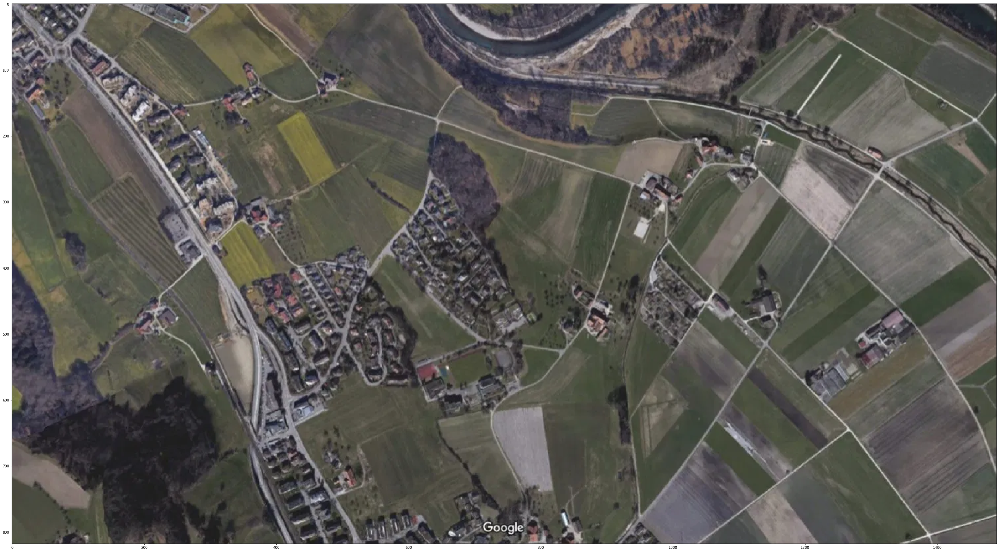

In [4]:
plt.figure(figsize = (50,50))
img=mpimg.imread('/Users/theodoreplotkin/desktop/postmalone/GA_Data_Science/GA_github_repo/HW/final/images/satelite.png')
imgplot = plt.imshow(img)
plt.show()

## and you are asked to come up with the following algorithm:

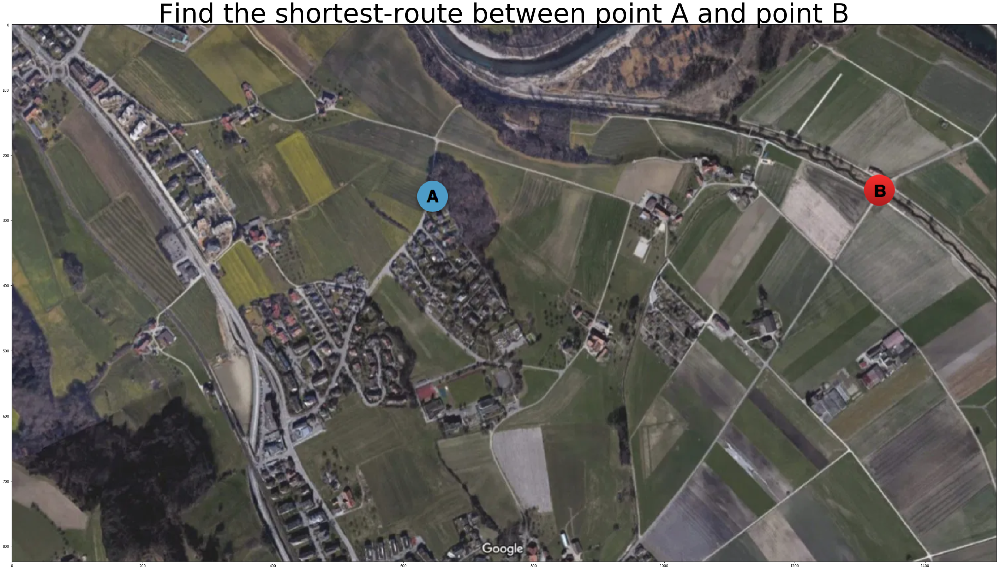

In [11]:
plt.figure(figsize = (50,50))
img=mpimg.imread('/Users/theodoreplotkin/desktop/postmalone/GA_Data_Science/GA_github_repo/HW/final/images/sateliteO.png')
imgplot = plt.imshow(img)
plt.title("Find the shortest-route between point A and point B", fontsize = 75)
plt.show()

# How would you approach this problem?

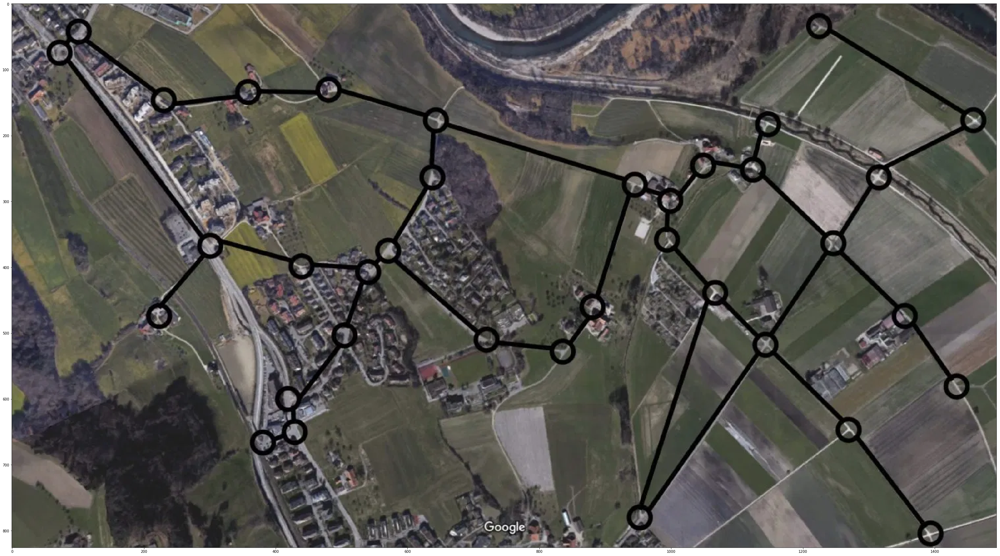

In [3]:
plt.figure(figsize = (50,50))
img=mpimg.imread('/Users/theodoreplotkin/desktop/postmalone/GA_Data_Science/GA_github_repo/HW/final/images/satelite_graph.png')
imgplot = plt.imshow(img)
#plt.title("A map of the Paris subway", fontsize = 200)
plt.show()

# ...consider the following `graph` overlay...

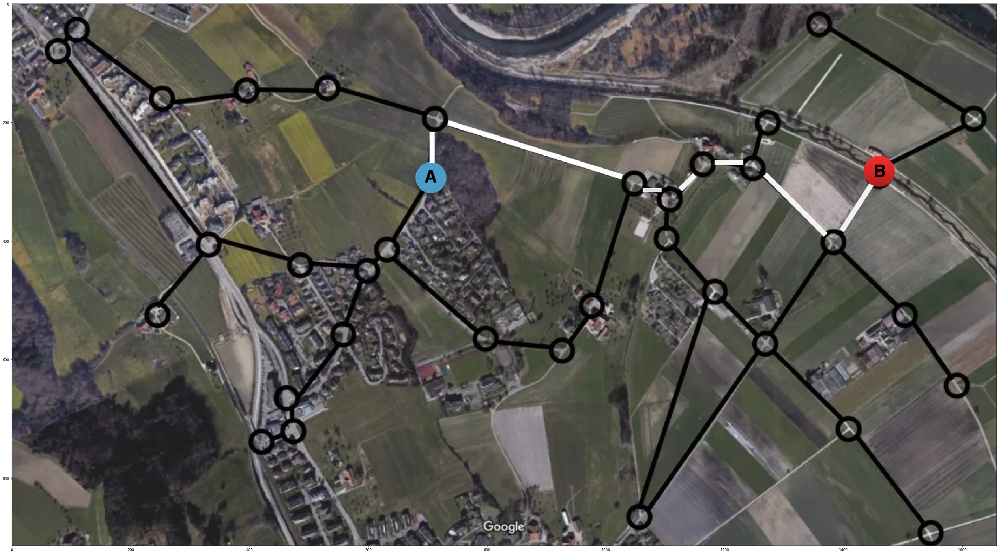

In [5]:
plt.figure(figsize = (50,50))
img=mpimg.imread('/Users/theodoreplotkin/desktop/postmalone/GA_Data_Science/GA_github_repo/HW/final/images/satelite_graphO.png')
imgplot = plt.imshow(img)
plt.show()

Ok, but how do we actually come up with a piece of software that returns the best path between `ANY` two points on the graph? 

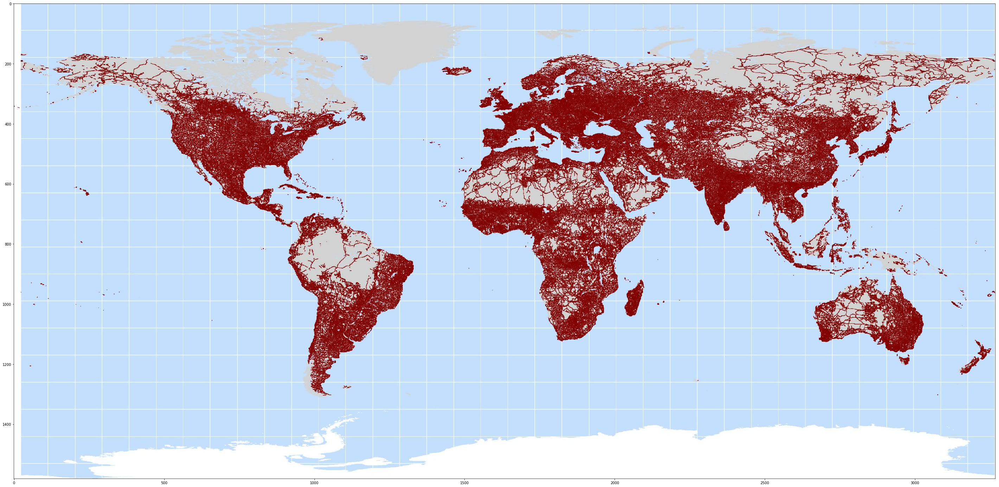

In [14]:
plt.figure(figsize = (50,50))
img=mpimg.imread('/Users/theodoreplotkin/desktop/postmalone/GA_Data_Science/GA_github_repo/HW/final/images/wi69vmnqi6sy.jpg')
imgplot = plt.imshow(img)
plt.show()

How can we scale this software to handle a graph the size of the road network of the entire world?

Note: `Dijkstra's Shortest Path Algorithm` would not scale to a problem of this size

# An interesting solution is found in the theory of `Optimal Transport (OT)`

"The basic problem in OT can be best exemplified by the problem of assigning workers to jobs: given the distribution of a population of workers with heterogenous skills, and given the distribution of jobs with heterogenous characteristics, how should one assign workers to firms in order to maximize the total economic output" ~ Galichon, 2016

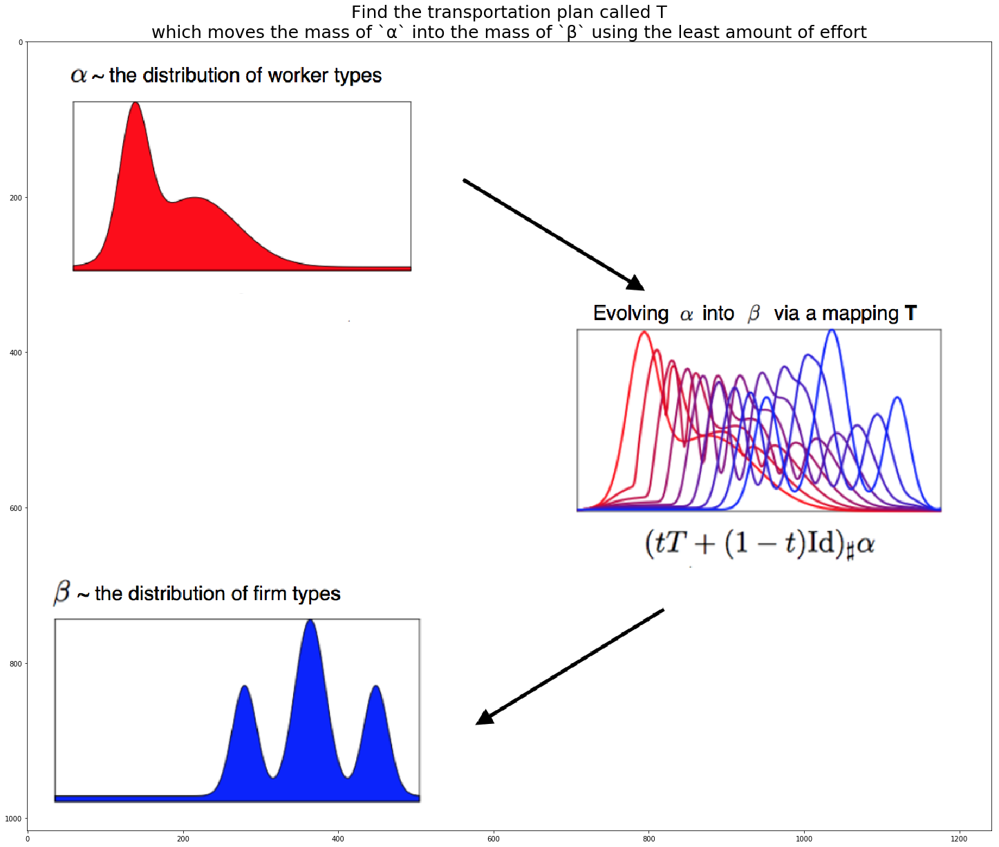

In [63]:
plt.figure(figsize = (25,40))
img=mpimg.imread('/Users/theodoreplotkin/desktop/postmalone/GA_Data_Science/GA_github_repo/HW/final/images/evolution.png')
imgplot = plt.imshow(img)
plt.title("Find the transportation plan called T"+"\n"+"which moves the mass of `α` into the mass of `β` using the least amount of effort", fontsize = 25)
plt.show()

### OT has found a surprising variety of applications across risk management, clinical research, financial derivatives pricing, deep learning, operations management/logistics, astrophysics, etc...

# `The Optimal Flow Problem` = OT + Directed Networks 

The solution to the `Optimal Flow Problem` offers us an algorithm for finding the shortest path between point A and point B on a directed network

For a real world example, let us imagine we wish to find the best path from station A to station B in a vast subway network like `The realiable NYC Subway` or `The Paris Métro`

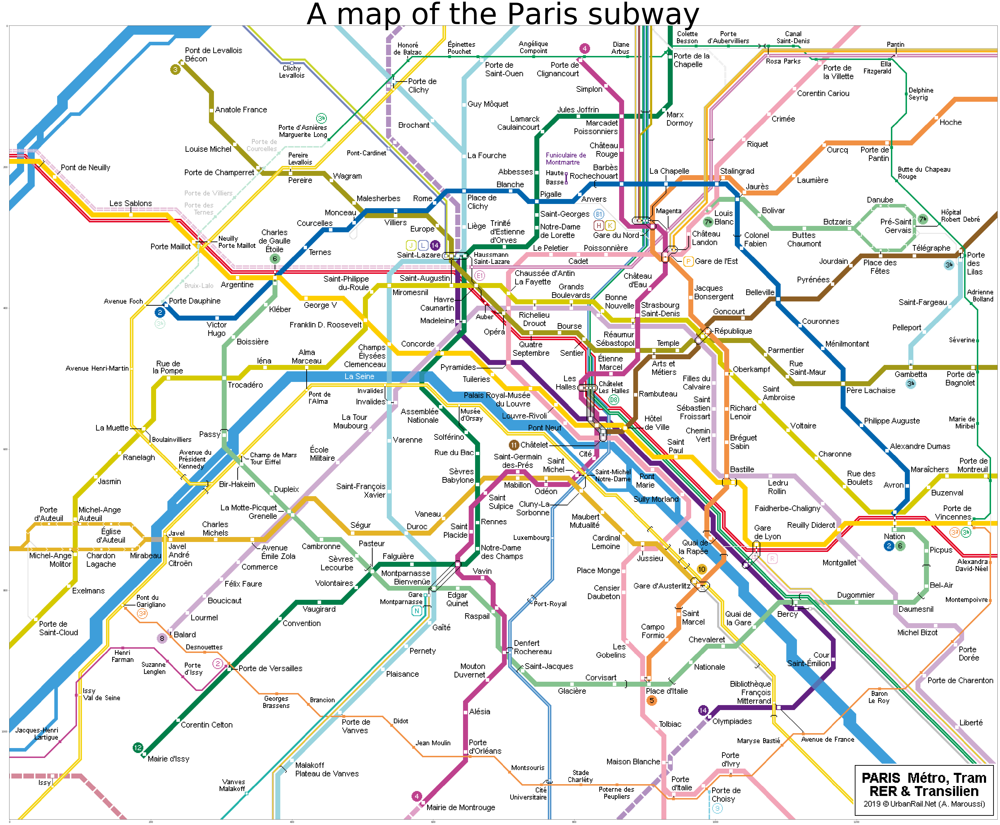

In [78]:
plt.figure(figsize = (75,75))
img=mpimg.imread('/Users/theodoreplotkin/desktop/postmalone/GA_Data_Science/GA_github_repo/HW/final/images/paris-map-centre.png')
imgplot = plt.imshow(img)
plt.title("A map of the Paris subway", fontsize = 125)
plt.show()

## Phrasing the subway routing problem as an `Optimal Flow Problem`

- ### `S` - set of tunnel arcs (x,y) connecting each station

- ### `ℓ(x,y)` -  physical length of subway tunnel arc between station x and station y (supposing that x and y are adjacent)

### `𝜑(x,y)`  is the path list - a list of indicators (booleans) -- the transportation plan that we are solving for!

 - `𝜑(x,y) = 1` if the subway tunnel arc between station x and station y corresponds to an arc along a possible path between A and B and `0` otherwise.

- if the arc connecting station x to station y is included along a given path between A and B, we incure `ℓ(x,y)𝜑(x,y) = ℓ(x,y)*1 = ℓ(x,y) > 0` units of distance on our trip



- if the arc connecting station x to station y is not included in the path between A and B, then `ℓ(x,y)*0 = 0` units of distance are incurred

Therefore the cumulative distance of our trip from station A to station B is given as the sum over all individual track lengths included in any given path 𝜑 from A to B:

$$\:Dist(A,B)[\varphi]\: =\: \sum_{(x,y)\in S} \varphi(x,y)\ell(x,y)$$

There can be multiple viable `feasible flows` (candidate paths) 𝜑 from A to B, but we seek the unique path which solves the following minimization problem:

$$ min\sum_{(x,y)\in S} \varphi(x,y)\ell(x,y)$$

 $$s.t. \:\:  {\nabla'}{\varphi} = n,$$
  $${\varphi}\geq0$$ 

### if 𝜑 does not satisfy the constraint `∇′𝜑=𝑛`, then 𝜑 is not a feasible flow from station A to station B and we rule it out as possible solution

- ### `∇'` - is the subway network's `incidence matrix`, a sparse matrix of 1s and -1s
- ### `n` - the station list (this is where the user inputs origin station A and destination B)
- #### for anyone interested in electrical engineering, `∇′𝜑=𝑛` is essentially Kirchoff's Law

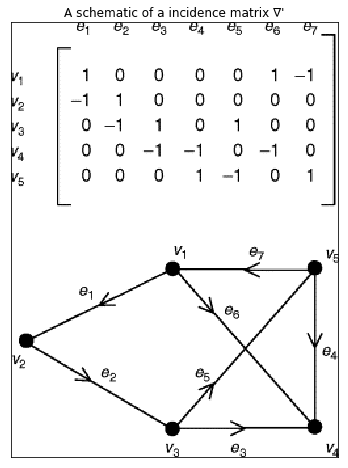

In [116]:
plt.figure(figsize = (10,8))
img=mpimg.imread('/Users/theodoreplotkin/desktop/postmalone/GA_Data_Science/GA_github_repo/HW/final/images/smallgraph.gif')
imgplot = plt.imshow(img)
imgplot.axes.get_xaxis().set_visible(False)
imgplot.axes.get_yaxis().set_visible(False)
plt.title("A schematic of a incidence matrix ∇'", fontsize = 12)
plt.show()

A smaller example of an `incidence matrix` for a directed graph

- The incidence matrix captures the structure of the directed graph in a simple sparse encoding

- If the network was on a continent level size, it would be mostly 0s and thus very easy to compress/store

                             Reference 
Galichon, Alfred. Optimal Transport Methods in Economics. Princeton University Press, 2016.